# ML(H)
## John Williamson 2019/2020

---

# Visualisation in machine learning

## Outline
In this lab we will explore how we can use visualisation to explore data before we begin training models. We will do this in the context of a challenge to classify audio data.

### Task
The task involves optimising the pre-processing of features for a simple classification problem, using visualisation (unsupervised learning) to help guide you in choosing good feature vector selection. The idea is to get *insight* into the data **using visualisation** to create effective machine learning models.

### Classifier
We will only use the most basic of classifiers in this example -- **k nearest neighbours** -- and focus on how to process the features to make this simple algorithm work as effectively as possible. Many modern approaches would use deep learning to learn an end-to-end classifier that infers appropriate feature extraction directly.

Everything to do the analysis and testing is provided for you. Your task is to modify the parameters that affect the creation of the feature vectors (see the green highlighted box below) and explore different visualisations to help identify a good feature transform.


In [1]:
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import audio_task
%matplotlib inline

## Motivation
This topic is essentially the operations behind the **Stane** project [Paper](http://www.dcs.gla.ac.uk/~rod/publications/MurWilHugQua08.pdf) [Video](http://www.dcs.gla.ac.uk/~rod/Videos/i_chi2.mov)


This used 3D printed textures on mobile devices. Scratching the fingernail across the surface generates distinctive sounds, which are propagated through the case and picked up by a piezo microphone. Different regions have different textures, and thus the area being rubbed can be determined by analysing the audio signal.

<img src="imgs/piezo.png" width="400px">
<img src="imgs/stane_real.png" width="400px">
<!-- <img src="imgs/shell.png" width="400px">
<img src="imgs/disc.png" width="400px"> -->



### Feature vectors
In almost all machine learning contexts, we predict outputs given a **fixed length** set of features; the input space a fixed dimension $d$. Each of those features is usually (but not always) continuous-valued.

Sometimes the data fall naturally into this space (e.g. classifying the iris type by 3 physical measurements). In cases such as in audio classification, though, we want to make predictions based on *time series*; a set of measurements of the same variable set made repeatedly over time.

#### Windowing
One general solution to this time series problem is to break a sequence up into a fixed length sequence of previous measurements. For example the measurements $[x_{t=t}, x_{t=t-1}, x_{t=t-2}, \dots, x_{t=t-d}]$ might make up the feature vector. This process is known as *windowing*, because we chop up the data into fixed length windows by "sliding" a time window along the data. **Consecutive (but possible discontiguous or overlapping) windows are almost universally used in audio contexts.**

<img src="imgs/contiguous_windows.png">
<img src="imgs/overlapping_windows.png">

These windows can overlap, which increases the size of the training set, but excessive overlapping can capture lots of redundant features examples. This can increase overfitting and training time without improving the classifier performance. Balancing the size of the windows (and thus the feature vector size $d$) and the amount of overlap is a matter of experimentation and domain knowledge.

-----------------

## Feature transforms

Often the "natural" raw form of the data can be difficult to classify. This might be because it has very high dimension, it is very noisy, or the classification boundary just isn't very compatible with your classifier (e.g. the class borders in the original space are highly-nonlinear and you are using a linear classifier). 

**Feature engineering** is the art of finding transforms of the raw data that increase classifier performance. These can often be simple, such as dropping some of the measurements entirely (under the assumption that they are irrelvant), or averaging measurements together (under the assumption that this reduces noise).

### Audio transforms
**Audio** data tends to be very high dimensional -- you might get 4000 to 44100 measurements for a single second of data.  A single audio sample has very little information indeed; it is the longer-term (millisecond to second) properties that have all the interesting information. 

So want transforms that pull out interesting features **over time**. The classical feature transform is the **Fourier transform**, which rewrites a signal varying over time as a sum of sinusoidal (periodic) components. This functions much like our ear works, splitting up audio in **frequency bands**, each of which has a **phase** and an **amplitude**. Many of these are already implemented in standard libraries, like the Fast Fourier Transform (fft) and the Discrete Cosine Transform (dct). We will use these in our classification problem.

# The challenge
<a id="challenge"></a>
You have to use visualisation strategies to choose a feature vector transform for a classifier that classifies the region of a device that is being touched based on the sound recorded from a piezo contact microphone. There are four possible touch regions and also a silence/handling noise class (class 0):

<img src="imgs/regions.png"> 

The data are all in the `data/` folder.

You have training data for these regions, `challenge_train_{01234}.wav`

See the code below which plots test datasets consisting of labeled mixtures of these classes alongside your predicted labels.  The code below loads the data from 4Khz 16 bit mono wavefiles into a collection of features vectors `X` and a corresponding set of labels `y`.  

### Feature selection
You can modify the feature selection properties set below to adjust the results. **The rest of the pipeline is fixed  -- you cannot modify the classifier itself in this exercise.**
<div class="alert alert-box alert-success">
    
This cell below is the only control you have over the performance of the classification. You will use the visualisation techniques to explore how these transforms change the data you get. NOTE: you may well not understand the meaning of the parameters. Use the visualisations to help guide you to a good choice.
</div>

In [2]:
######### PARAMETERS ##################
# You can change these values
# 1 sample = 1/4096 of a second

parameters = {
'size':256, # how long each window is, in samples
'step':128, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1.0), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"hann", # one of window_fns (below)
'feature_fn':"fft" # one of feature_fns    
}
#####################################

# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])
# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']

Run the following cells to (re)load the data into a set of features and labels

In [3]:
X, y = audio_task.load_data(parameters)
print("X shape", X.shape, "y shape", y.shape)

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a hann window.
X shape (7696, 256) y shape (7696,)


In [4]:
# if you don't have UMAP installed, uncomment and run the line below (once only)
#!pip install --no-cache --user umap-learn

## Visualisation

We can visualise these features. Experiment with using:
* PCA `sklearn.decomposition.pca`
* LLE `sklearn.manifold.LocallyLinearEmbedding`
* ISOMAP `sklearn.manifold.Isomap`
* tSNE `sklearn.manifold.TSNE`
* UMAP `umap`

You can use alternative visualisation methods if you wish. **You may need to subsample the features to visualise in reasonable time.**. For example, you can subsample to just every 10th feature vector using `X[::10, :]`

Use the visualisations to find a feature vector selection that you expect to perform well with a a kNN classifier. Use the visualisation to explore these transforms rather than trial and error with the classifier itself.

<div class="alert alert-box alert-success"> 

**Task**: iterate over visualisations and tweaks to the feature preprocessing to see if you can find a structure that separates classes well.
</div>

### Using PCA

Before visualising PCA we check to see what proportion of the variance is kept when reducing the dimensionality to 2 dimensions
For the The 

To explain at least 90% of the variance you would need 114 components
Two components gives 0.4327046693517387% of the explained variance


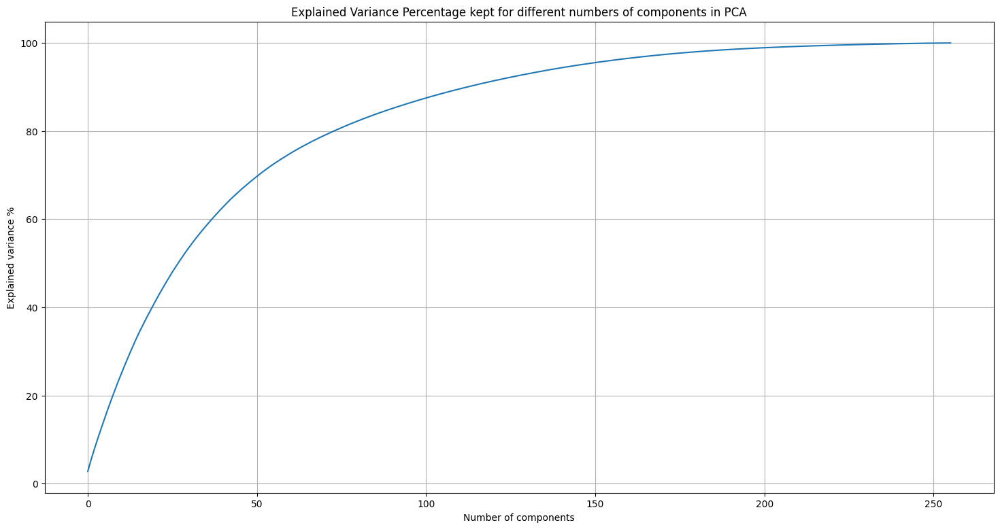

In [88]:
from sklearn.decomposition import PCA 
import sklearn.manifold, umap

pca = PCA(n_components=X.shape[-1])
pca.fit(X)

plt.figure(figsize=(18,9))
plt.grid()
plt.plot(np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained variance %')
plt.title('Explained Variance Percentage kept for different numbers of components in PCA')

two_components_explained_variance = (pca.explained_variance_[0] + pca.explained_variance_[1]) * 100
cumlative_variance = 0
for idx,explained_variance in enumerate(pca.explained_variance_ratio_):
    
    cumlative_variance += explained_variance * 100
    if cumlative_variance >= 90:
        n_components_90 = idx + 1
        break
print(f'To explain at least 90% of the variance you would need {n_components_90} components')
print(f'Two components gives {two_components_explained_variance}% of the explained variance')

Looking at varying the feature and window functions we can see this improves for some combinations drastically

In [61]:
import pandas as pd
from sklearn.decomposition import PCA

parameters = {
    'size': 256,
    'step': 128,
    'decimate': 1,
    'feature_range': (0.0, 1.0),
    'window_fn': "hann",
    'feature_fn': "fft"
}

feature_fns = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
window_fns = ['hamming', 'hann', 'boxcar', 'blackmanharris']

def pca_explained_var(parameters):
    X_temp, y_temp = audio_task.load_data(parameters)
    
    pca = PCA(n_components=X_temp.shape[-1])
    pca.fit(X_temp)
    return(pca.explained_variance_ratio_ * 100,X_temp.shape[-1])


pca_components_df = pd.DataFrame(index=['PCA Component ' + str(i) for i in range(1, 257)])


for feature_fn in feature_fns:
    for window_fn in window_fns:
        parameters['feature_fn'] = feature_fn
        parameters['window_fn'] = window_fn

        exp_var, n_components = pca_explained_var(parameters)

        column_name = f"{feature_fn}, {window_fn}"
        pca_components_df[column_name] = exp_var

# Print the resulting DataFrame
pca_components_df

Loading into 701 windows of length 256
Loading into 1644 windows of length 256


Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a blackmanharris window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of leng

In [86]:
cumulative_pca_df = pca_components_df.cumsum(axis=0)

sorted_df = cumulative_pca_df.T.sort_values(by=['PCA Component 2'], ascending=False).T
sorted_df_2 = pca_components_df.T.sort_values(by=['PCA Component 2'], ascending=False).T

sorted_df


,"cepstrum, hamming","cepstrum, boxcar","cepstrum, hann","cepstrum, blackmanharris","fft, blackmanharris","fft, hann","fft, hamming","fft, boxcar","dct, blackmanharris","dct, hann",...,"raw, hamming","raw, boxcar","fft_phase, blackmanharris","fft_phase, boxcar","fft_phase, hann","dct_phase, blackmanharris","fft_phase, hamming","dct_phase, boxcar","dct_phase, hann","dct_phase, hamming"
PCA Component 1,99.975906,99.975895,99.975656,99.975407,73.683585,71.967107,71.675785,70.293935,57.934362,56.487757,...,4.886450,2.764213,2.052320,2.324065,1.783061,1.677285,1.681285,1.235885,1.200924,1.140381
PCA Component 2,99.985503,99.985335,99.985266,99.984725,77.436039,75.631583,75.325419,73.838705,60.952167,59.411647,...,9.718755,5.473808,4.028119,3.697839,3.335965,3.171409,3.151569,2.407400,2.321940,2.199517
PCA Component 3,99.991793,99.991738,99.991629,99.991164,79.842874,77.902176,77.571540,75.929625,63.045960,61.284804,...,14.007629,7.947607,5.966365,4.894879,4.845771,4.587751,4.601693,3.157684,3.421540,3.243696
PCA Component 4,99.995099,99.995273,99.995000,99.994708,81.879536,79.798770,79.432308,77.557635,64.937218,62.920639,...,18.116476,10.328520,7.812588,6.064364,6.278827,5.883600,5.970337,3.901709,4.432786,4.207044
PCA Component 5,99.996800,99.996864,99.996732,99.996547,83.690801,81.456938,81.040563,78.882359,66.709797,64.386497,...,22.000751,12.610077,9.610534,7.170464,7.678845,7.165173,7.313614,4.608231,5.382494,5.105157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PCA Component 252,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,99.998299,99.992243,...,99.998745,99.972482,100.000000,100.000000,100.000000,99.781917,100.000000,99.092262,99.676670,99.603530
PCA Component 253,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,99.998818,99.994396,...,99.999145,99.980379,100.000000,100.000000,100.000000,99.853585,100.000000,99.324979,99.774234,99.717367
PCA Component 254,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,99.999293,99.996394,...,99.999498,99.988064,100.000000,100.000000,100.000000,99.924233,100.000000,99.555251,99.868951,99.829784
PCA Component 255,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,99.999752,99.998311,...,99.999758,99.995351,100.000000,100.000000,100.000000,99.973342,100.000000,99.781427,99.946973,99.931710


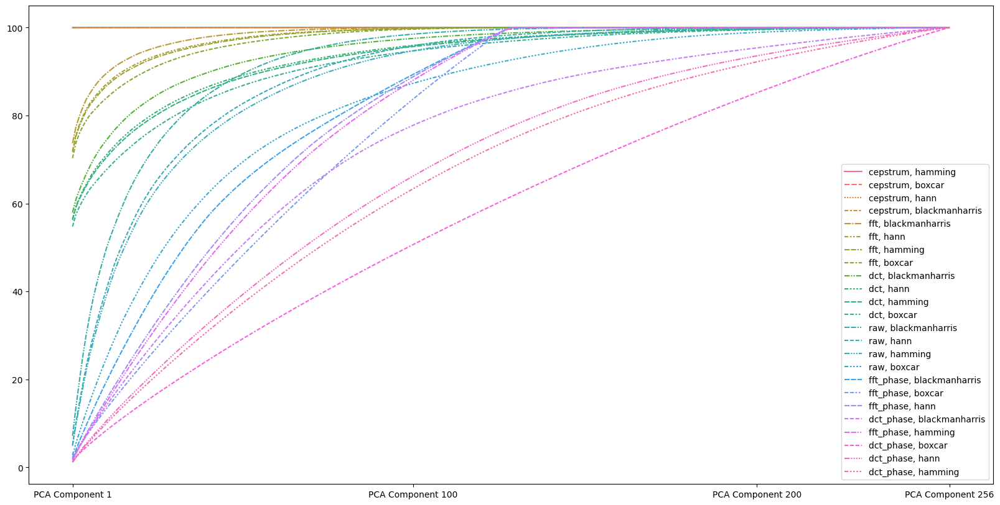

In [83]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=sorted_df.rename_axis(None))
plt.xticks([0,99,199,255])
plt.show()

2023-11-26 19:27:07.752301: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-26 19:27:07.752356: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-26 19:27:07.754400: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-26 19:27:07.766741: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-26 19:27:09.282474: W tensorflow/compiler/tf2

(-2.0995886058019213, 19.50751906140274, -4.088972519065928, 5.842528761935528)

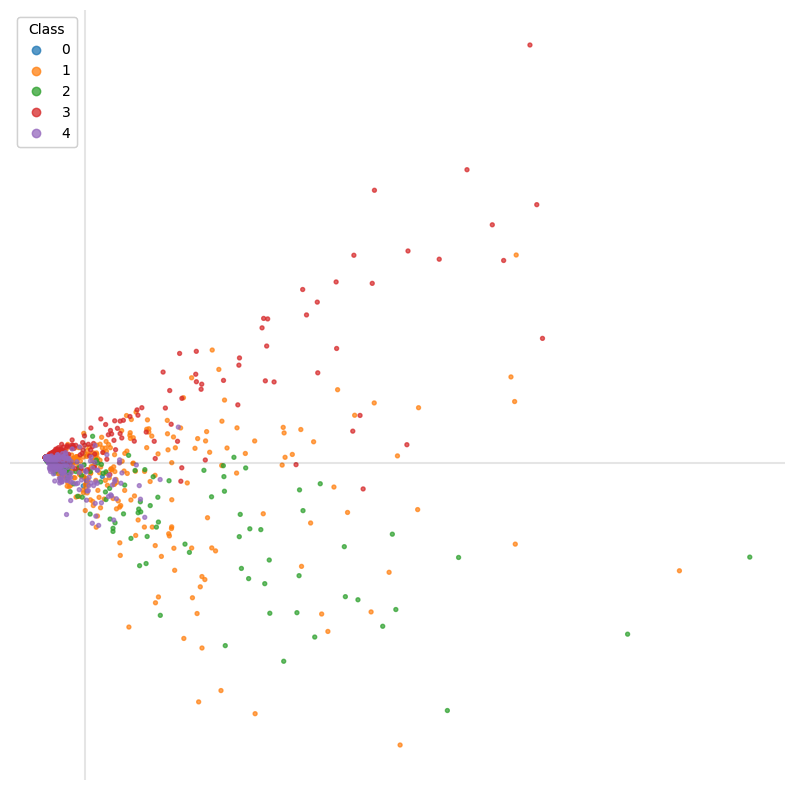

In [5]:
import sklearn.decomposition, sklearn.manifold, umap

# example showing PCA of features
fig, ax = plt.subplots(figsize=(10, 10))

# create a PCA object
pca2 = sklearn.decomposition.PCA(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
pca2_X = pca2.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    pca2_X[:, 0],
    pca2_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)


##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")

In [6]:
import plotly.express as px
import pandas as pd
import sklearn.decomposition

# Assuming X is your data matrix (replace it with your actual data)
# X should be a 2D array where each row represents a sample and each column represents a feature
# For example, you can replace X with your actual data like X = your_actual_data

# create a PCA object
pca3 = sklearn.decomposition.PCA(n_components=3)

# transform every fifth vector (to save computation time)
subsample = 5
pca3_X = pca3.fit_transform(X[::subsample, :])
pca3_df = pd.DataFrame(data=pca3_X, columns=[f'PC{i+1}' for i in range(3)])
pca3_df['Target'] = y[::subsample]

# Create an interactive 3D scatter plot
fig = px.scatter_3d(pca3_df, x='PC1', y='PC2', z='PC3', color='Target')

fig.show()


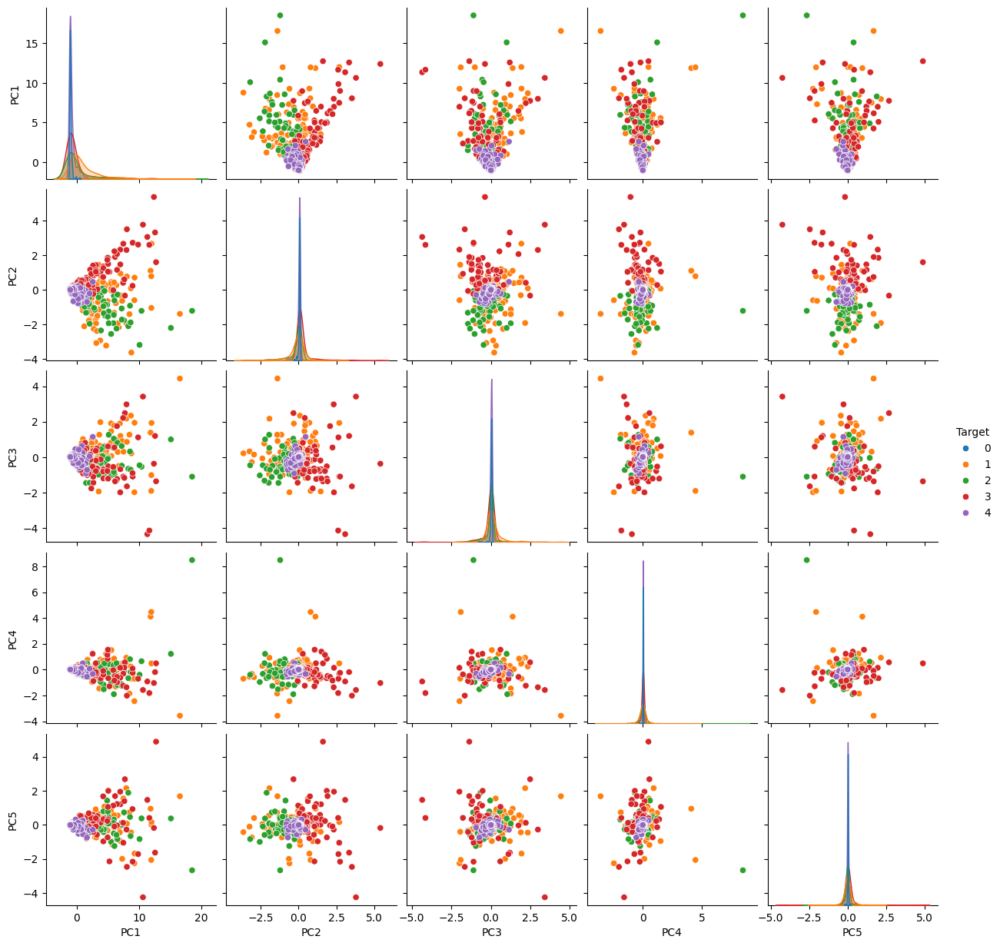

In [7]:
import pandas as pd
import seaborn as sns


# PCA transformation
pca5 = sklearn.decomposition.PCA(n_components=5)
subsample = 5
pca5_X = pca5.fit_transform(X[::subsample, :])

# Combine PCA-transformed data with target variable y
pca_df = pd.DataFrame(data=pca5_X, columns=[f'PC{i+1}' for i in range(5)])
pca_df['Target'] = y[::subsample]


sns.pairplot(pca_df, hue='Target',palette="tab10") 

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a boxcar window.
Loading into 701 windows of 

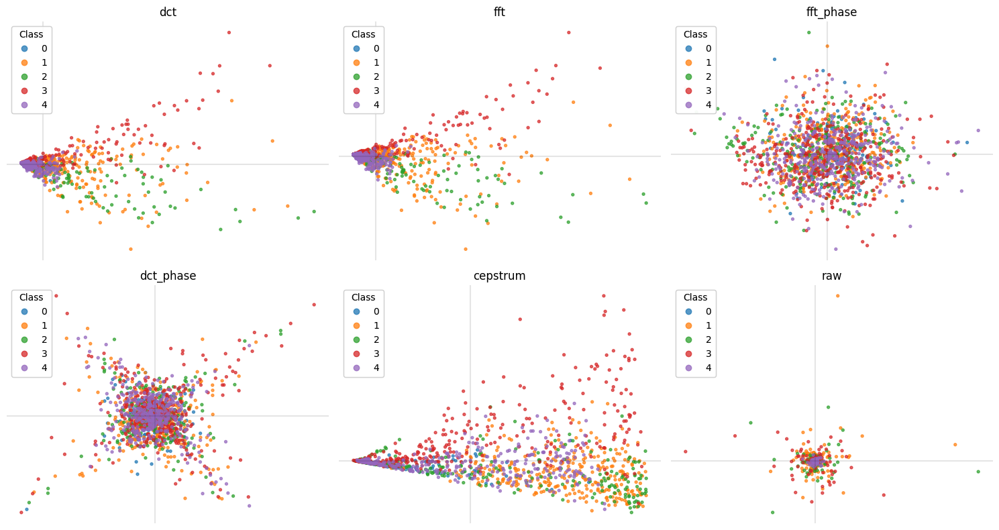

In [8]:
def plot_scatter_pca(ax, pca_X, y, title):
    scatter = ax.scatter(
        pca_X[:, 0],
        pca_X[:, 1],
        c=y,
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.set_title(title)
    ax.axis("off")

parameters = {
    'size': 256,
    'step': 128,
    'decimate': 1,
    'feature_range': (0.0, 1.0),
    'window_fn': "boxcar",
}

feature_fns = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']

# Change the layout to 2 rows and 3 columns
num_rows, num_cols = 2, 3
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

for idx, feature_fn in enumerate(feature_fns):
    parameters['feature_fn'] = feature_fn

    # Load data using audio_task.load_data
    X_temp, y_temp = audio_task.load_data(parameters)

    # Create a PCA object
    pca2 = sklearn.decomposition.PCA(n_components=2)

    # Transform every fifth vector (to save computation time)
    subsample = 5
    pca2_X = pca2.fit_transform(X_temp[::subsample, :])

    # Plot scatter plot for each feature function
    plot_scatter_pca(axs[idx // num_cols, idx % num_cols], pca2_X, y_temp[::subsample], feature_fn)

plt.tight_layout()
plt.show()


Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a blackmanharris window.


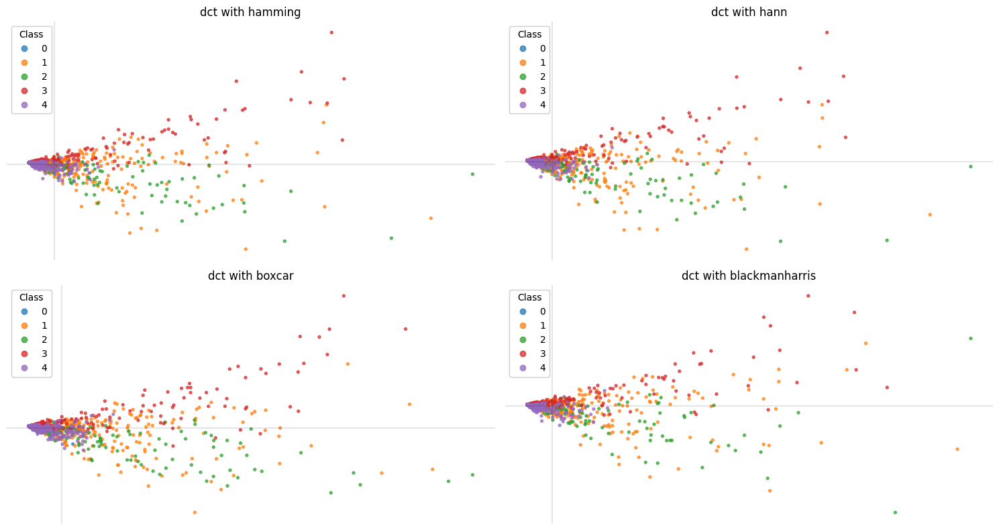

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a blackmanharris window.


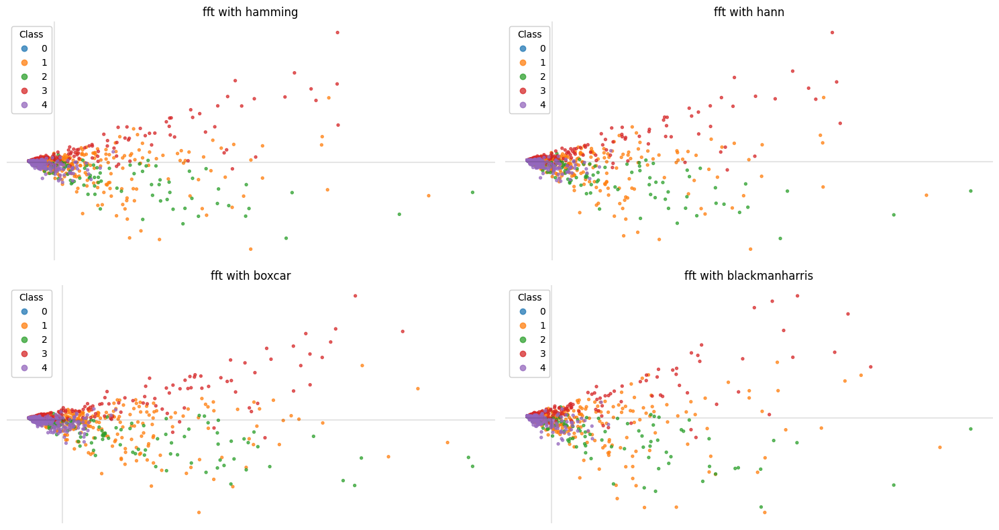

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a blackmanharris window.


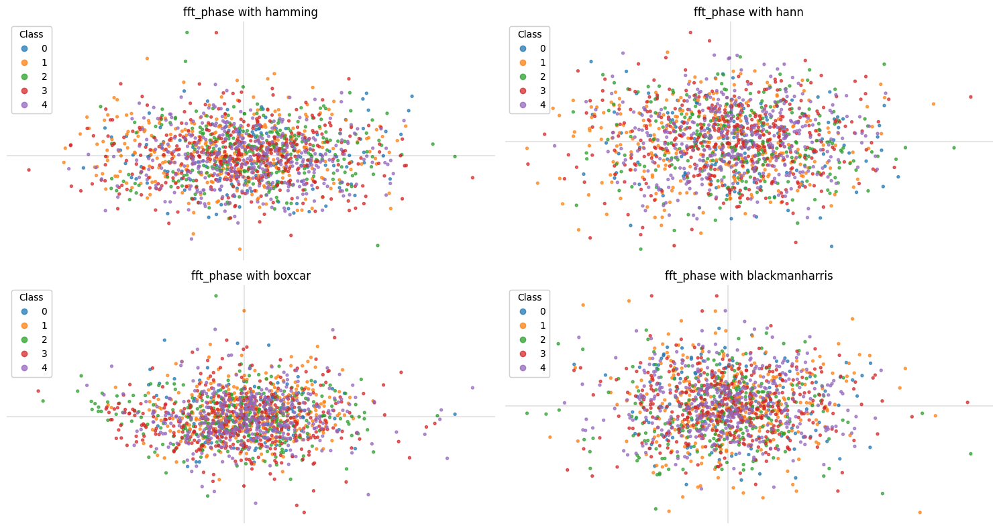

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a blackmanharris window.


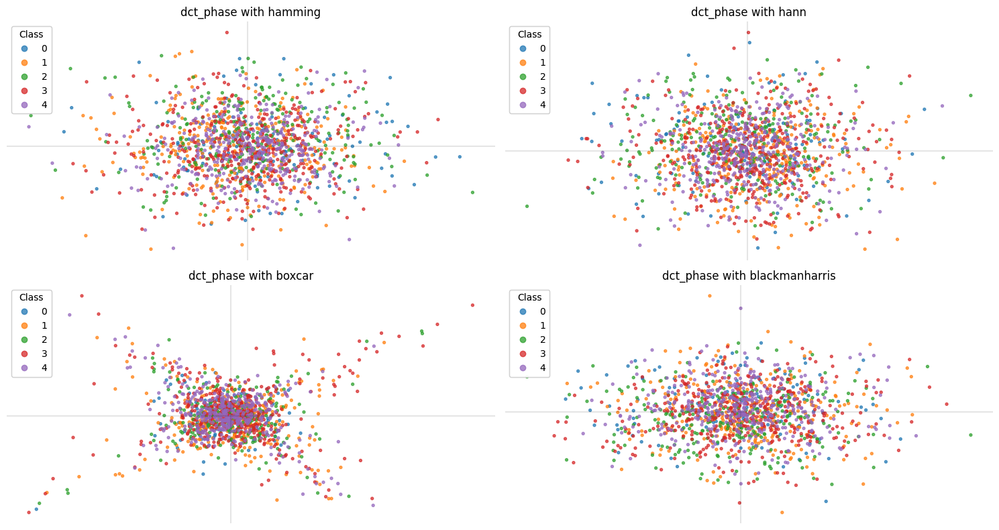

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using cepstrum transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using cepstrum transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using cepstrum transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using cepstrum transform and a blackmanharris window.


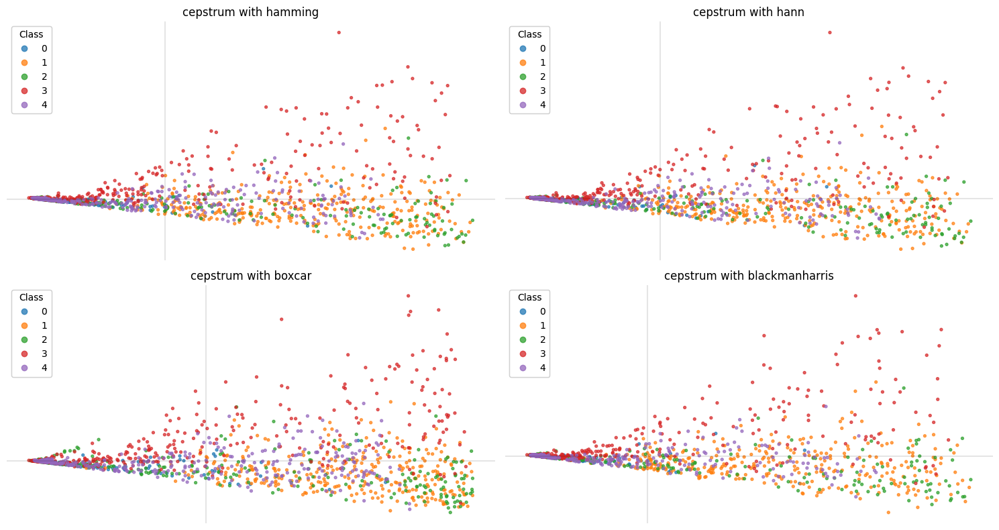

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a blackmanharris window.


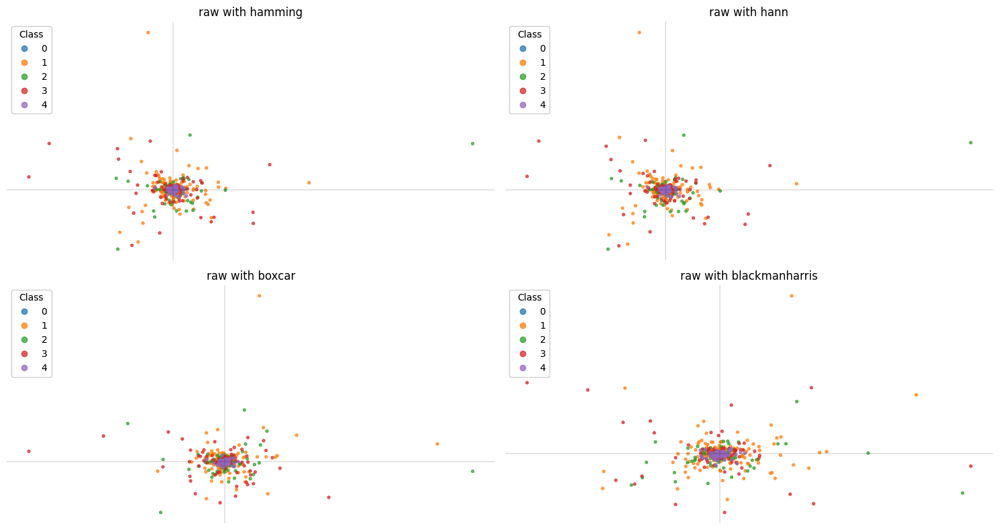

In [9]:
parameters = {
    'size': 256,
    'step': 128,
    'decimate': 1,
    'feature_range': (0.0, 1.0),
    'window_fn': "boxcar",
    'feature_fn' :"dct_phase"
}
for i in feature_fns:
    feature_fn = i
    window_fns = ['hamming', 'hann', 'boxcar', 'blackmanharris']
    # Change the layout to 2 rows and 3 columns
    num_rows, num_cols = 2, 2
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

    for idx, window_fn in enumerate(window_fns):
        parameters['window_fn'] = window_fn
        parameters['feature_fn'] = feature_fn

        # Load data using audio_task.load_data
        X_temp, y_temp = audio_task.load_data(parameters)

        # Create a PCA object
        pca2 = sklearn.decomposition.PCA(n_components=2)

        # Transform every fifth vector (to save computation time)
        subsample = 5
        pca2_X = pca2.fit_transform(X_temp[::subsample, :])

        # Plot scatter plot for each feature function
        plot_scatter_pca(axs[idx // num_cols, idx % num_cols], pca2_X, y_temp[::subsample], feature_fn + ' with ' + window_fn)

    plt.tight_layout()
    plt.show()


### Using LLE

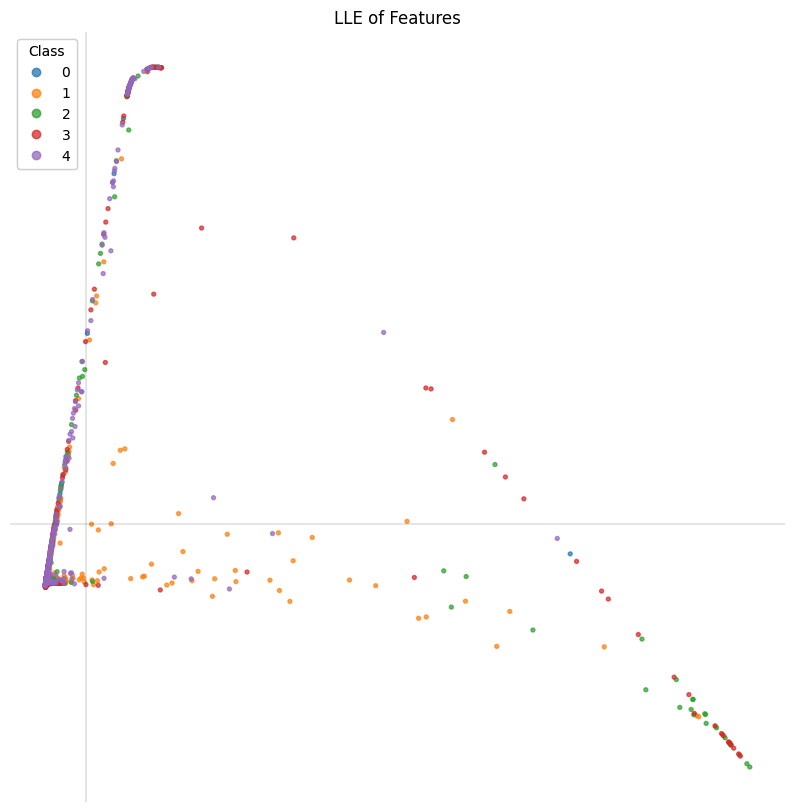

In [10]:
fig, ax = plt.subplots(figsize=(10, 10))

lle2 = sklearn.manifold.LocallyLinearEmbedding(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
lle2_X = lle2.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    lle2_X[:, 0],
    lle2_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)

##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")
plt.title('LLE of Features')
plt.show()

### Using ISOMAP

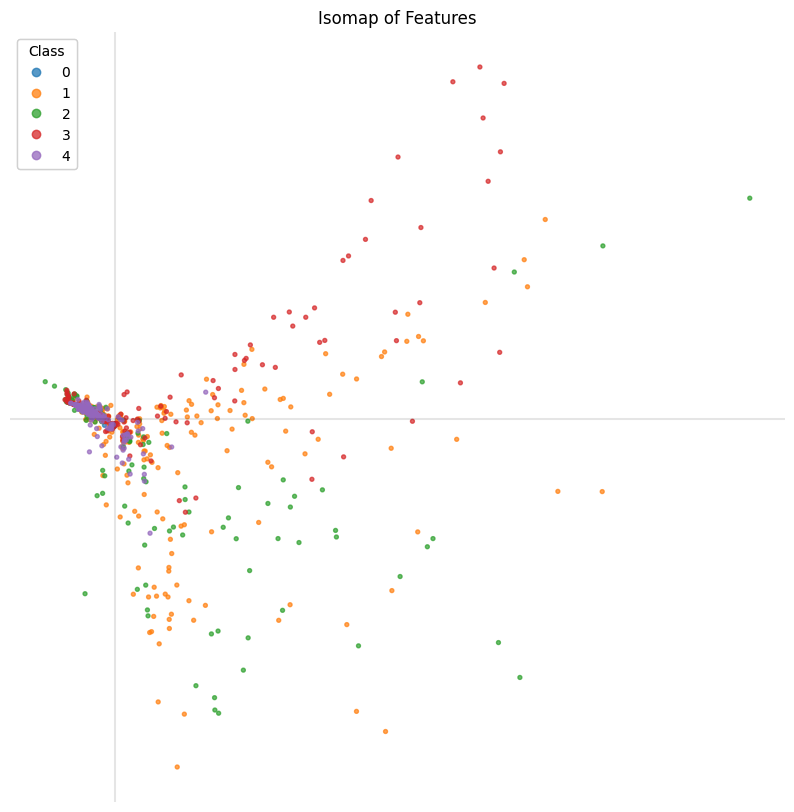

In [11]:
# example showing Isomap of features
fig, ax = plt.subplots(figsize=(10, 10))

# create an Isomap object
isomap2 = sklearn.manifold.Isomap(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
isomap2_X = isomap2.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    isomap2_X[:, 0],
    isomap2_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)

##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")
plt.title('Isomap of Features')
plt.show()


### Using tSNE

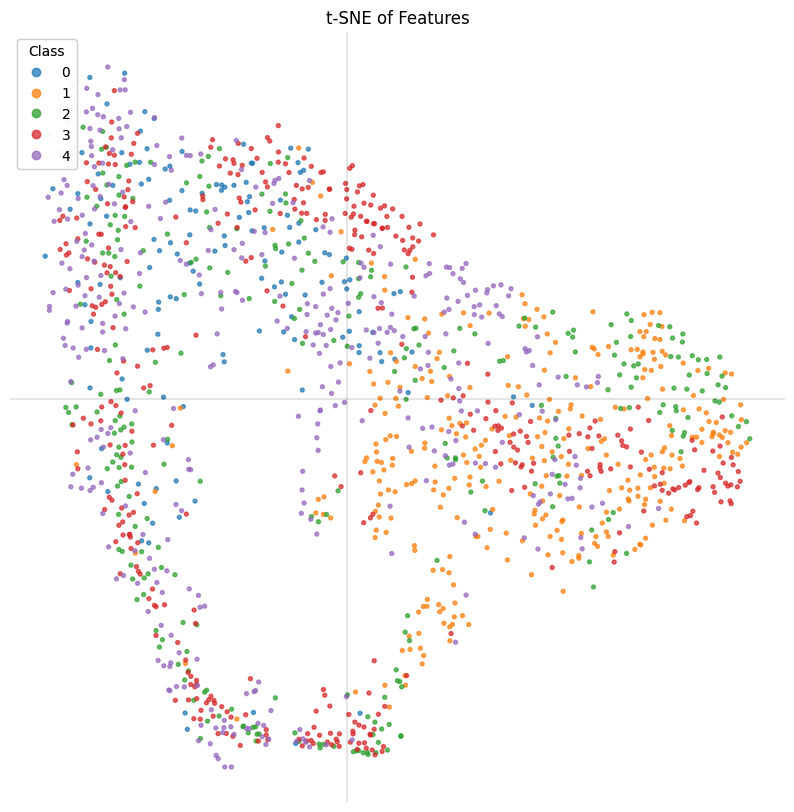

In [12]:
# example showing t-SNE of features
fig, ax = plt.subplots(figsize=(10, 10))

# create a t-SNE object
tsne2 = sklearn.manifold.TSNE(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
tsne2_X = tsne2.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    tsne2_X[:, 0],
    tsne2_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)

##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")
plt.title('t-SNE of Features')
plt.show()


### Using UMAP

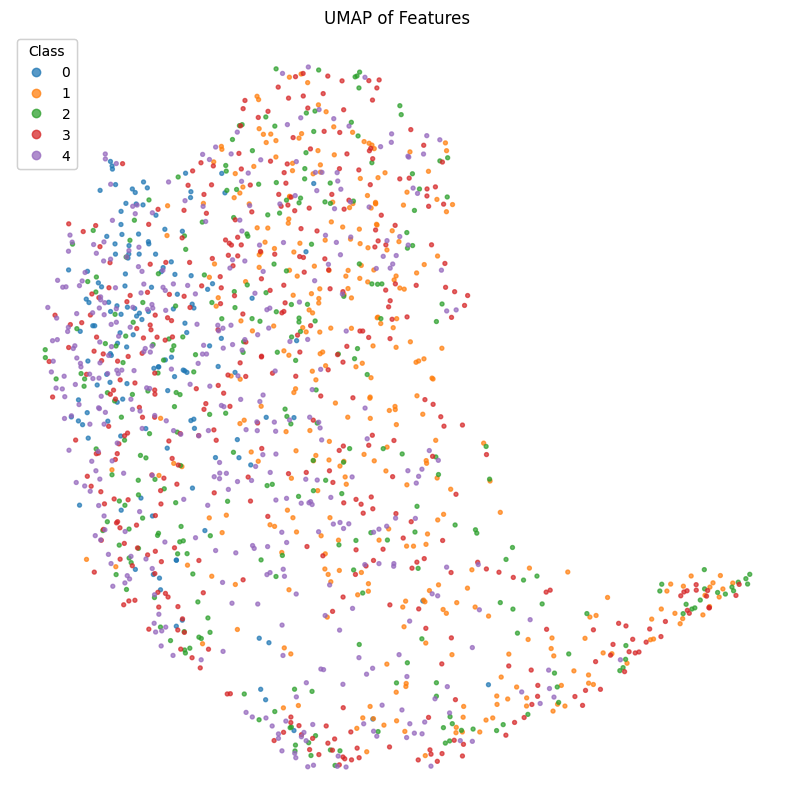

In [36]:
# example showing UMAP of features
fig, ax = plt.subplots(figsize=(10, 10))

# create a UMAP object
umap2 = umap.UMAP(min_dist=0.2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
umap2_X = umap2.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    umap2_X[:, 0],
    umap2_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)

legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

# ax.axhline(0, color="k", alpha=0.1)
# ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")
plt.title('UMAP of Features')
plt.show()


Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a hamming window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a hamming window.
Loading into 701 windows

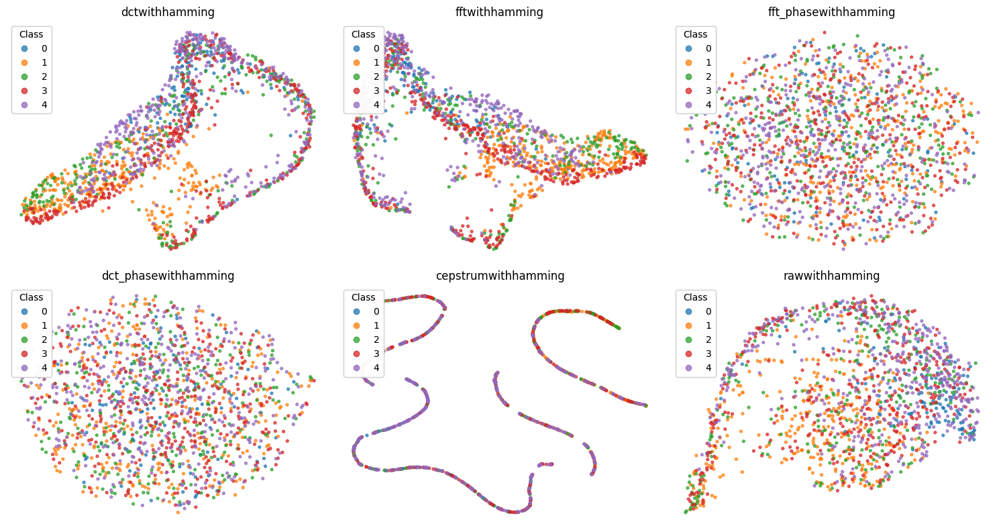

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a hann window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a hann window.
Loading into 701 windows of length 2

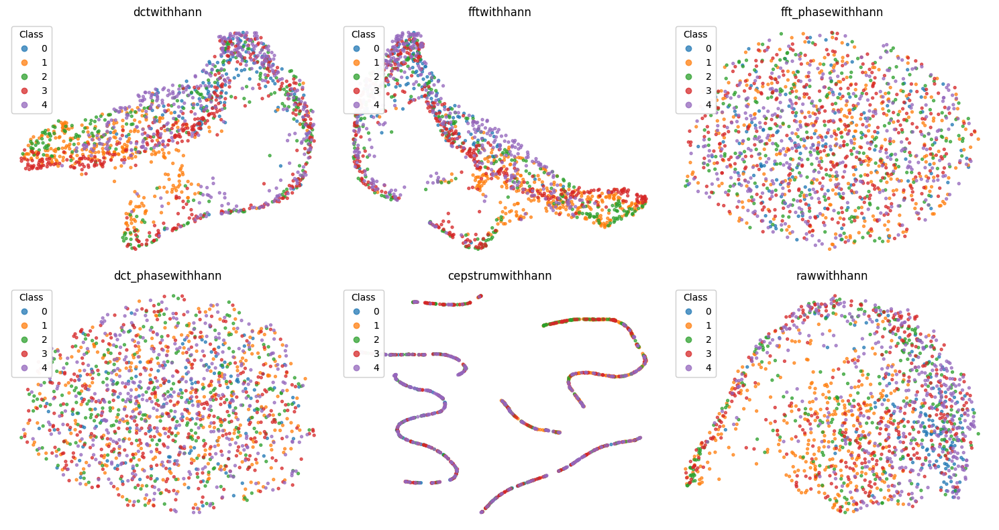

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a boxcar window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a boxcar window.
Loading into 701 windows of 

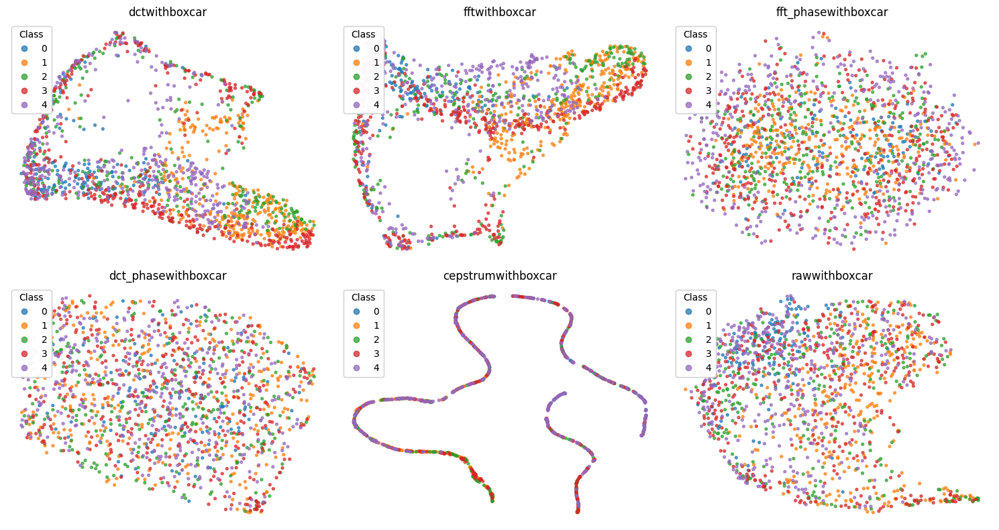

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct transform and a blackmanharris window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft transform and a blackmanharris window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using fft_phase transform and a blackmanharris window.
Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using dct_phase transform and a blackmanharris wind

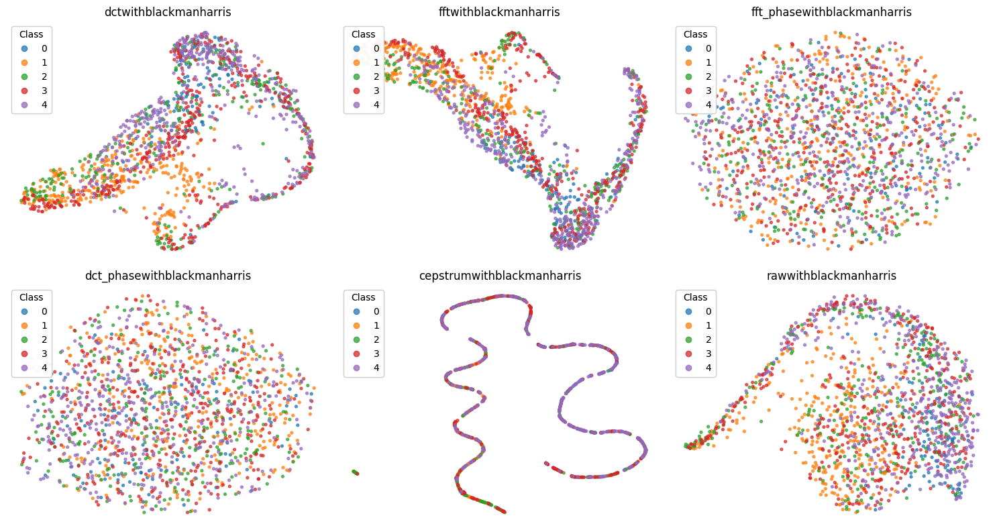

In [39]:
import umap

# Function to plot scatter using UMAP
def plot_scatter_umap(ax, umap_X, y, title):
    scatter = ax.scatter(
        umap_X[:, 0],
        umap_X[:, 1],
        c=y,
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(title)
    ax.axis("off")

# Parameters
parameters = {
    'size': 256,
    'step': 128,
    'decimate': 1,
    'feature_range': (0.0, 1.0),
    'window_fn': "boxcar",
}

feature_fns = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
for window_fn in window_fns:
    parameters['window_fn'] = window_fn

    # Change the layout to 2 rows and 3 columns
    num_rows, num_cols = 2, 3
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

    for idx, feature_fn in enumerate(feature_fns):
        parameters['feature_fn'] = feature_fn

        # Load data using audio_task.load_data
        X_temp, y_temp = audio_task.load_data(parameters)

        # Create a UMAP object
        umap_model = umap.UMAP(min_dist=0.2)
        # Transform every fifth vector (to save computation time)
        subsample = 5
        umap_X = umap_model.fit_transform(X_temp[::subsample, :])

        # Plot scatter plot for each feature function using UMAP
        plot_scatter_umap(axs[idx // num_cols, idx % num_cols], umap_X, y_temp[::subsample], feature_fn + 'with' + window_fn)

    plt.tight_layout()
    plt.show()



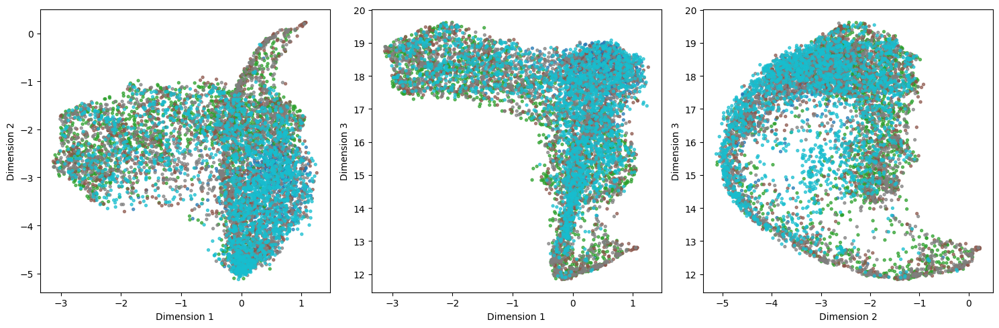

In [15]:
umap_model_3d = umap.UMAP(n_components=3)
umap_X_3d = umap_model_3d.fit_transform(X)

# Projection onto 2D slices
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot 2D slices
for i, (dim1, dim2) in enumerate([(0, 1), (0, 2), (1, 2)]):
    axes[i].scatter(umap_X_3d[:, dim1], umap_X_3d[:, dim2], c=y, cmap="tab10", alpha=0.7, s=8)
    axes[i].set_xlabel(f'Dimension {dim1 + 1}')
    axes[i].set_ylabel(f'Dimension {dim2 + 1}')

plt.tight_layout()
plt.show()

In [16]:
import umap
import plotly.express as px

# Create a 3D UMAP model
umap_model_3d = umap.UMAP(n_components=3)
umap_X_3d = umap_model_3d.fit_transform(X)

# Create a DataFrame for the 3D UMAP coordinates and class labels
umap_df = pd.DataFrame(data=umap_X_3d, columns=['UMAP1', 'UMAP2', 'UMAP3'])
umap_df['Class'] = y

# Create an interactive 3D scatter plot with plotly
fig = px.scatter_3d(
    umap_df, x='UMAP1', y='UMAP2', z='UMAP3',
    color='Class', opacity=0.7,
    size_max=8,
    labels={'Class': 'Class'}
)

# Customize the layout
fig.update_layout(scene=dict(aspectmode='cube'))

# Show the interactive plot
fig.show()


## Classifier
The code below creates a standard KNN classifier which predicts the output class based on the 7 nearest elements in feature vector space. 

In [17]:
# fit a classifier
classifier = audio_task.knn_fit(X, y)



### Visualising predictions 
You can preview your results with a separate (non-secret) test set which is provided. This will show you a visualisation of your classifier versus the ground truth. Each visualisation shows the true activity (below the axis) as coloured blocks and the predicted activity (from the classifier) as coloured blocks above the axis.

In the case of perfect classification, the blocks above and below the line will be exactly the same. In practice, there will always be significant noise.

Testing with data/challenge_test_0
Loading into 613 windows of length 256
Predicting...
Prediction accuracy 0.091
Confusion matrix
[[ 20   4 232 220  15]
 [ 15  32  62 179  40]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 13   2  50  62  37]]

Testing with data/challenge_test_1
Loading into 950 windows of length 256
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[ 24  13 122 215  84]
 [  0   0   0   0   0]
 [  7  30  79 163  26]
 [ 10  53 111 226  56]
 [ 14  19  61 150  60]]

Testing with data/challenge_test_2
Loading into 429 windows of length 256
Predicting...
Prediction accuracy 0.248
Confusion matrix
[[  0   0   0   0   0]
 [  9  16  23  54  13]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 23   9 129 258 155]]

Testing with data/challenge_test_3
Loading into 886 windows of length 256
Predicting...
Prediction accuracy 0.273
Confusion matrix
[[ 28   2 162 268  14]
 [ 26  75  63 202 107]
 [  0   0   0   0   0]
 [ 14  51  90 285  33]
 [  0   0   0   0   0]]

Testing 

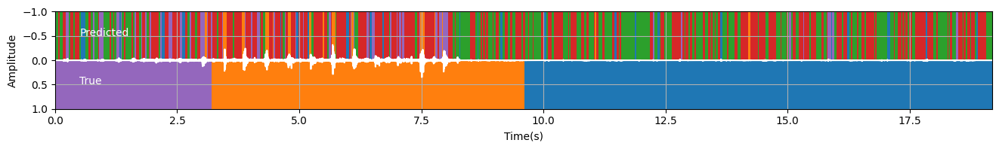

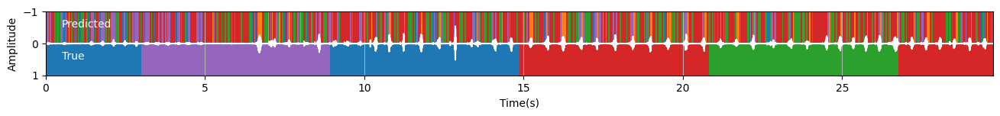

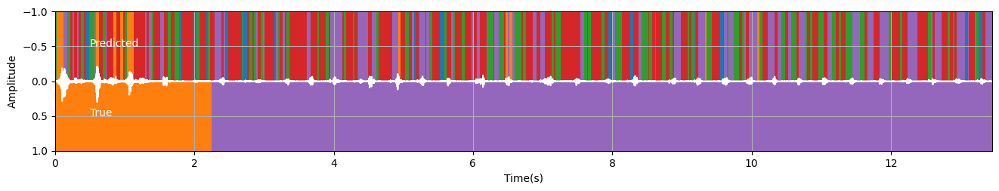

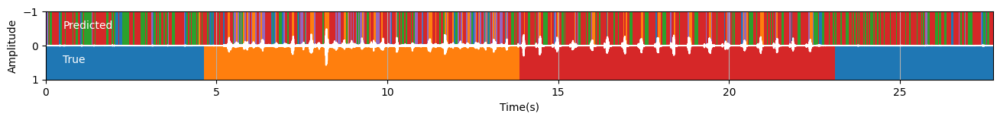

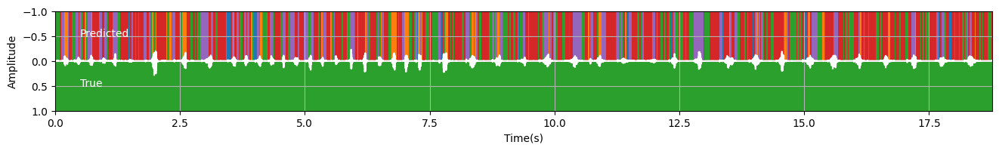

In [18]:
## Example usage -- show results for all of the test cases
for i in range(5):
    audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")

### Final test function
There is a test function `challenge_evaluate_performance(classifier_fn)`. This gives you your total current score. You don't have access to the internals of this function. See below for how to use it.
The test takes some time to run; so you must be parsimonious with your calls to it.

In [19]:
## Shows how to evaluate your performance
audio_task.run_secret_test(classifier, parameters)

Loading into 1553 windows of length 256
Predicting...


/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true sample

Loading into 488 windows of length 256
Predicting...
Loading into 290 windows of length 256
Predicting...


/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Loading into 1388 windows of length 256
Predicting...


/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true sample

Loading into 62 windows of length 256
Predicting...
Loading into 560 windows of length 256
Predicting...
Loading into 394 windows of length 256
Predicting...


/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Loading into 1177 windows of length 256
Predicting...
*** Total score: 62.50 ***


/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/home/jamie-linux/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

